In [2]:
import os
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from keras import backend as K
from keras import models
from PIL import Image
import json

In [3]:
warnings.filterwarnings("ignore")

In [4]:
img = plt.imread('../z20_data/B020401XX_00866.jpg')
dims = np.shape(img)
dims

(1988, 3000, 3)

In [5]:
mat = np.reshape(img, (dims[0]*dims[1], dims[2]))
mat

array([[122, 116, 120],
       [122, 116, 120],
       [122, 116, 120],
       ...,
       [145, 115, 113],
       [137, 113, 111],
       [ 15,   0,   0]], dtype=uint8)

In [6]:
print(np.shape(mat))

(5964000, 3)


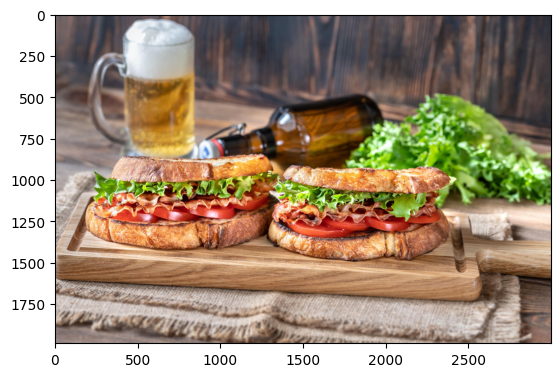

In [7]:
plt.imshow(img)

In [8]:
import cv2

def resize_image(img, size=(128,128)):
    return cv2.resize(img, size)

def he_img(img):
    return cv2.equalizeHist(img)

def normalize_img(img):
    return cv2.normalize(img, None, 0,255, cv2.NORM_MINMAX)


Text(0.5, 1.0, 'Normalized Image')

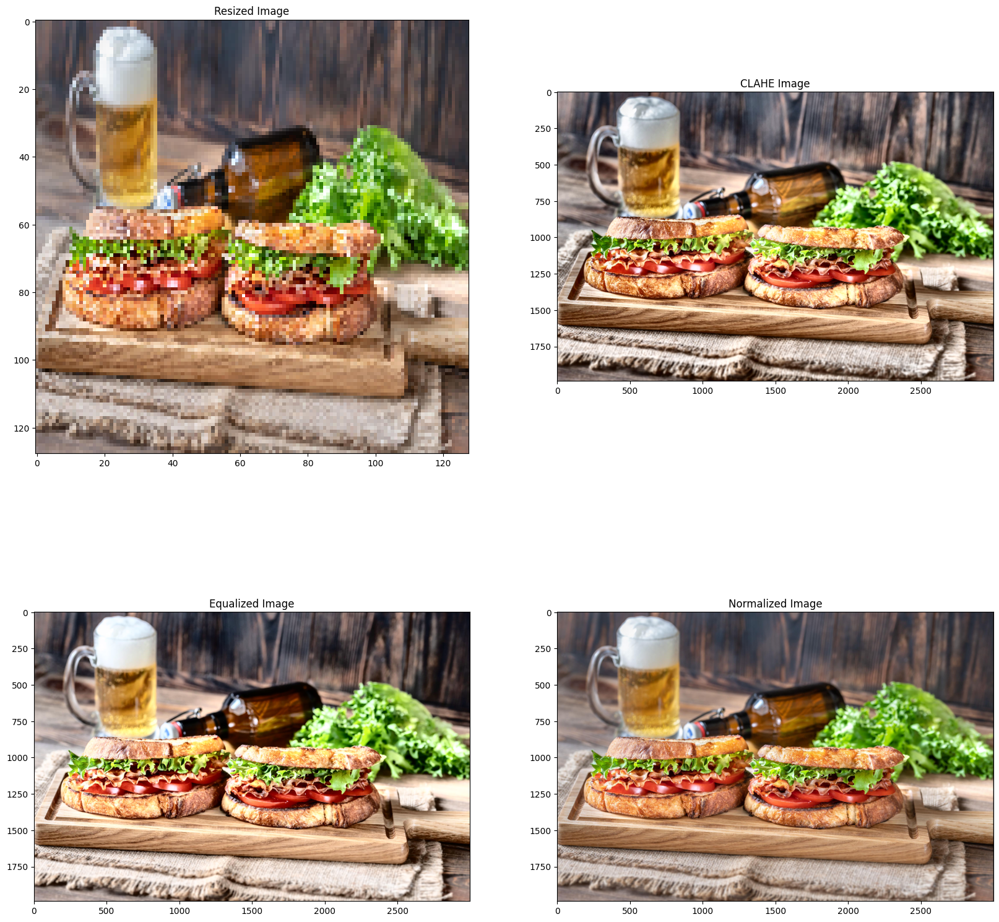

In [9]:
# 전처리 이미지 형태

fig = plt.figure(figsize=(20,20))

resize_img = resize_image(img)
plt.subplot(2,2,1)
plt.imshow(resize_img)
plt.title("Resized Image")

img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
y, u, v = cv2.split(img_yuv)
clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8, 8))
y_clahe = clahe.apply(y)
cl_y_img = cv2.merge([y_clahe, u,v])
img_clahe = cv2.cvtColor(cl_y_img, cv2.COLOR_YUV2BGR)
plt.subplot(2,2,2)
plt.imshow(img_clahe)
plt.title("CLAHE Image")

equalized_y = he_img(y)
he_y_img = cv2.merge([equalized_y, u, v])
eqz_img= cv2.cvtColor(he_y_img, cv2.COLOR_YUV2BGR)
plt.subplot(2,2,3)
plt.imshow(eqz_img)
plt.title("Equalized Image")

norm_img = normalize_img(img)
plt.subplot(2,2,4)
plt.imshow(norm_img)
plt.title("Normalized Image")

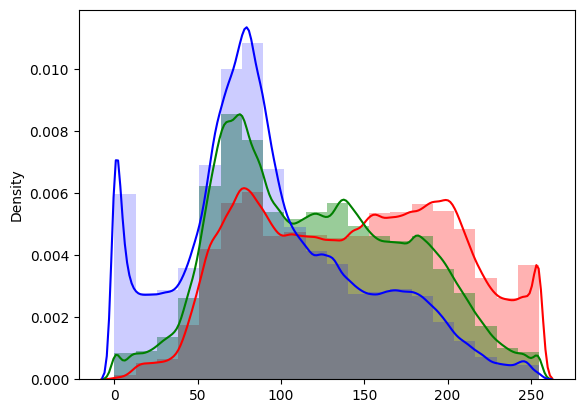

In [10]:
# Pixel Intensity
sns.distplot(mat[:,0], bins=20, color="red", hist_kws=dict(alpha=0.3))
sns.distplot(mat[:,1], bins=20, color="green", hist_kws=dict(alpha=0.4))
sns.distplot(mat[:,2], bins=20, color="blue", hist_kws=dict(alpha=0.2))
plt.show()

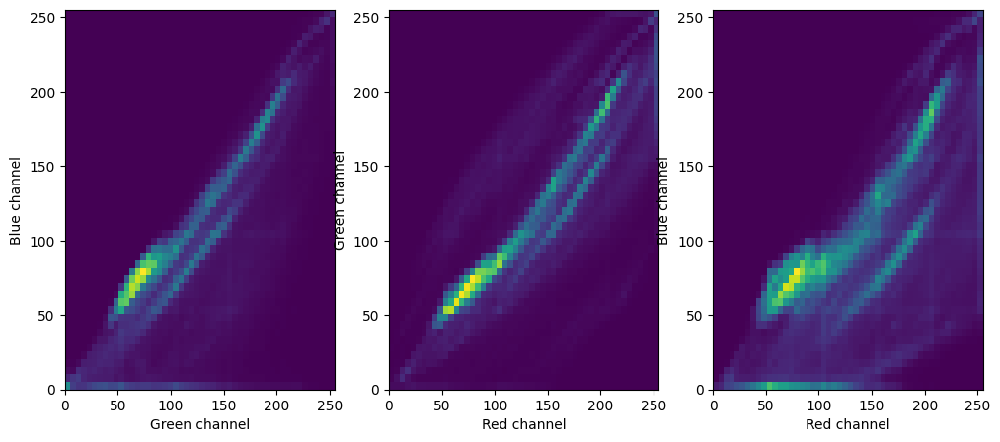

In [11]:
# 컬러별 2차원 조합
fig = plt.figure(figsize=(12,5))

plt.subplot(1,3,1)
_ = plt.hist2d(mat[:,1], mat[:,2], bins=(50,50))
plt.xlabel('Green channel')
plt.ylabel('Blue channel')

plt.subplot(1,3,2)
_ = plt.hist2d(mat[:,0], mat[:,1], bins=(50,50))
plt.xlabel('Red channel')
plt.ylabel('Green channel')

plt.subplot(1,3,3)
_ = plt.hist2d(mat[:,0], mat[:,2], bins=(50,50))
plt.xlabel('Red channel')
plt.ylabel('Blue channel')
plt.show()

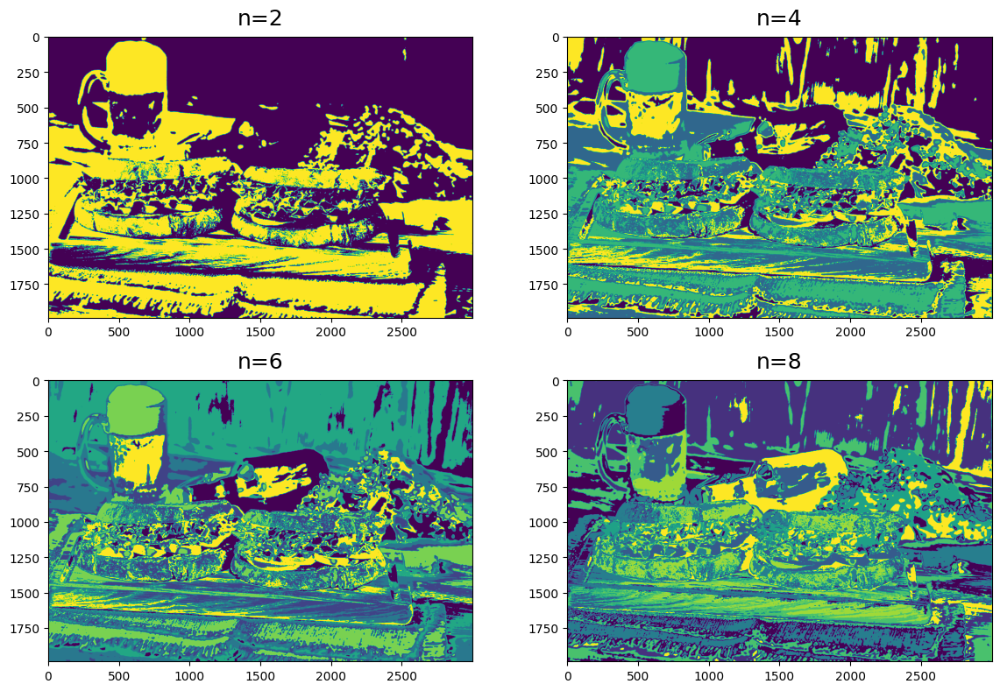

In [12]:
from sklearn import cluster
n_vals = [2,4,6,8]
plt.figure(1, figsize=(12,8))

for subplot, n in enumerate(n_vals):
    kmeans = cluster.KMeans(n)
    clustered = kmeans.fit_predict(mat)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered, (dims[0], dims[1]))
    plt.subplot(2,2,subplot+1)
    plt.title("n={}".format(n), pad = 10, size=18)
    plt.imshow(clustered_img)

plt.tight_layout()

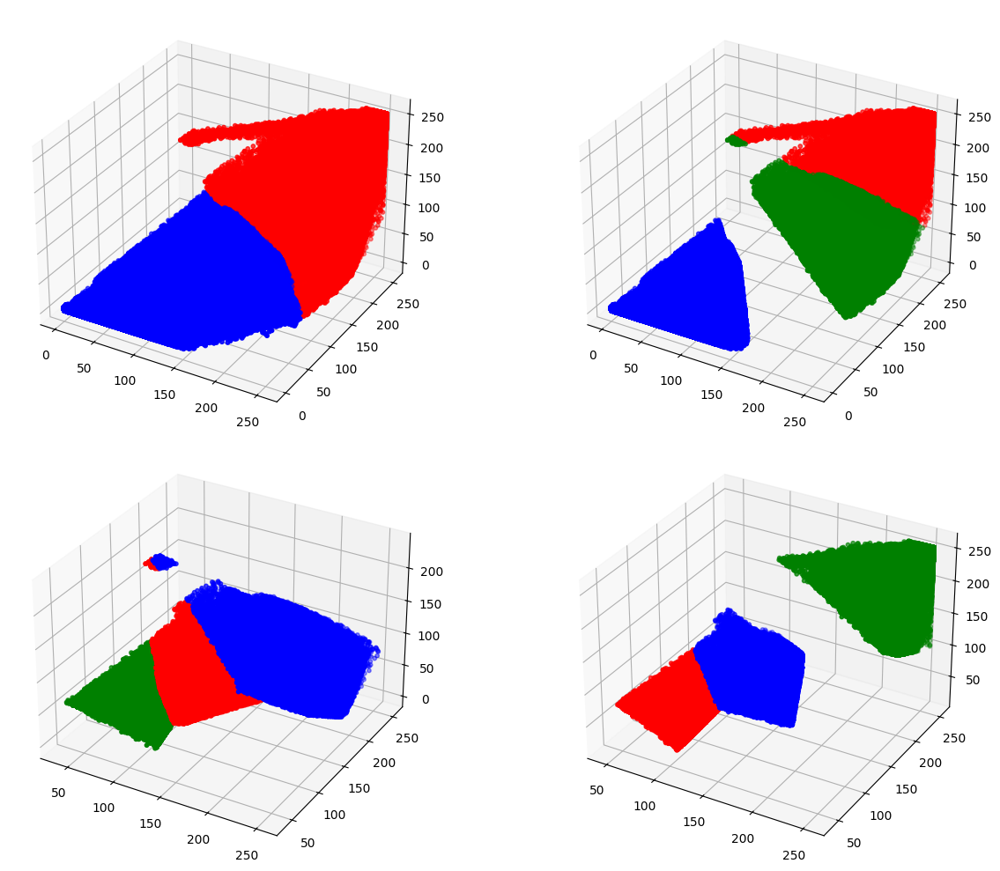

In [13]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(14,10))

ax = [fig.add_subplot(221, projection = '3d'),
      fig.add_subplot(222, projection = '3d'),
      fig.add_subplot(223, projection = '3d'),
      fig.add_subplot(224, projection = '3d')]

for plot_number, n in enumerate(n_vals):
    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(mat)
    x1, y1, z1 = [np.where(clustered == x)[0] for x in [0,1,2]]

    plot_vals = [('r', x1),
                 ('b', y1),
                 ('g', z1),]
    
    for c, channel in plot_vals:
        x = mat[channel, 0]
        y = mat[channel, 1]
        z = mat[channel, 2]
        ax[plot_number].scatter(x,y,z, c=c, s=10)

plt.tight_layout()

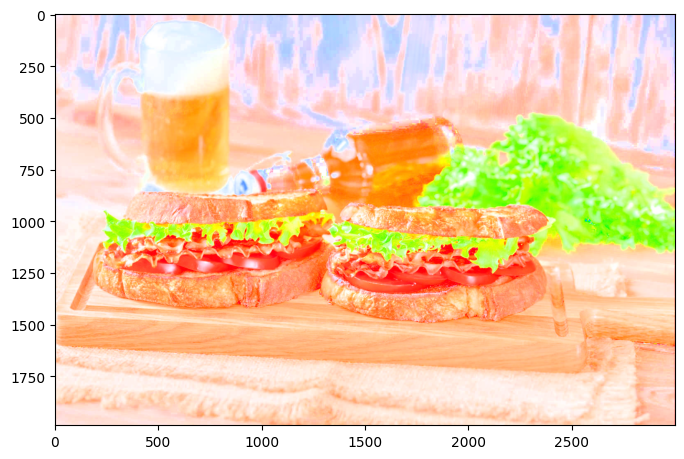

In [14]:
bnorm = np.zeros_like(mat, dtype = np.float32)
max_range = np.max(mat, axis = 1)
bnorm = mat / np.vstack((max_range, max_range, max_range)).T
bnorm_img = np.reshape(bnorm, (dims[0], dims[1], dims[2]))
plt.figure(figsize= (8,10))
plt.imshow(bnorm_img)
plt.show()

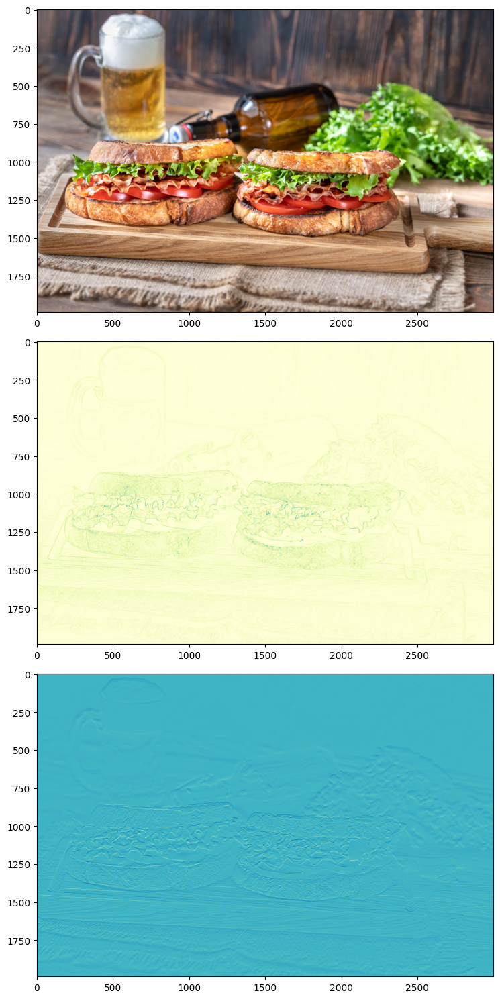

In [15]:
import skimage
from skimage.filters import sobel
from skimage.filters import sobel_h

plt.figure(1, figsize=(20,15))
cmap = "YlGnBu"
plt.subplot(3,1,1)
plt.imshow(img)

plt.subplot(3,1,2)
plt.imshow(sobel(img[:,:,1]), cmap=cmap)

plt.subplot(3,1,3)
plt.imshow(sobel_h(img[:,:,1]), cmap=cmap)

plt.tight_layout()

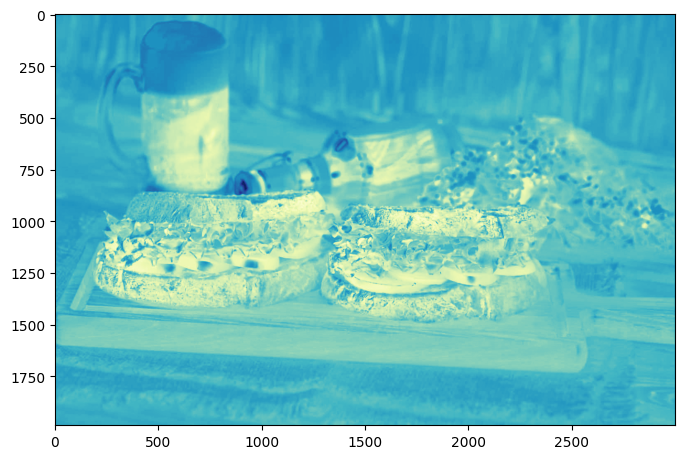

In [16]:
from sklearn.decomposition import PCA

pca = PCA(3)
pca.fit(mat)
img_pca = pca.transform(mat)
img_pca = np.reshape(img_pca, (dims[0], dims[1], dims[2]))

fig = plt.figure(figsize=(8,8))
plt.imshow(img_pca[:,:,1], cmap=cmap)

In [ ]:
# sample folder
import cv2
import json
import random
import shutil
import os

path = "..\\z20_data\\food_sample"

food_sample_folder = os.listdir(path)

image_folders = []
json_folders = []

all_images = []
new_jsons = []

for i, folder_name in enumerate(food_sample_folder):
    image_folders.append(folder_name)
    image = os.listdir(path+'/'+folder_name) 
    folder_path = os.path.join(path,folder_name)

    for j, file_name in enumerate(image): 
        file = os.path.join(folder_path,file_name)
        all_images.append(file)

In [17]:
# sample folder
# import cv2
# import json
# import random
# import shutil
# import os

# path = "..\\z20_data\\food_sample"

# food_sample_folder = os.listdir(path)

# image_folders = []
# json_folders = []

# all_images = []
# new_jsons = []

# for i, folder_name in enumerate(food_sample_folder):
#     if folder_name.find('json') != -1:
#         json_folders.append(folder_name)
#         jsons = os.path.join(path, folder_name)
#         for j, file_name in enumerate(jsons):
#             new_jsons.append(os.path.join(jsons, file_name)) 
#             print() 
            # with open(f'{path+'/'+folder_name+'/'+file_name}','r') as j:
            #     jsonfile = json.load(j)
            #     js = jsonfile[0] 

            # with open('../z20_data/new_json.txt','r') as n:
            #         add_json = json.load(n)   

            # with open('../z20_data/new_json.txt','w') as result:
            #         json.dump(jsonfile+add_json, result)          
            
    # else:
    #     image_folders.append(folder_name)
    #     image = os.path.join(path,folder_name) 

        # copy_folder = "C:\work\medical1\개인프로젝트\copy_files"
        # for j, file_name in enumerate(image): 
        #     dir_path = os.path.join(image,file_name)
            # copy_path = os.path.join(copy_folder,file_name)
            # all_images.append(dir_path)
            # try:
            #     shutil.copyfile(dir_path,copy_path)
            # except PermissionError as e:
            #     print(f"Permission error copying file {dir_path} to {copy_path}: {e}")
            # except FileNotFoundError as e:
            #     print(f"File not found: {dir_path}: {e}")
            # except Exception as e:
            #     print(f"Unexpected error copying file {dir_path}: {e}")

# print(all_images)
# print(image_folders)
# print(json_folders)

In [19]:
# for i, new_json in enumerate(new_jsons):
#     print(new_json)
#     with open(new_json,'r') as j: 
#         jsonfile = json.load(j)
#         js_f = jsonfile[0]["Code Name"]
#         js_n = jsonfile[0]["Name"]
#         js_w = jsonfile[0]["W"]
#         js_h = jsonfile[0]["H"]
#         js_p = jsonfile[0]["Point(x,y)"]
#         print(js_f, js_n, js_w, js_h, js_p)

In [20]:
# len(new_jsons)
# new_jsons[0]
# with open(f'{new_jsons[1]}','r') as j: 
#         jsonfile = json.load(j)
#         js = jsonfile[0] 
# js

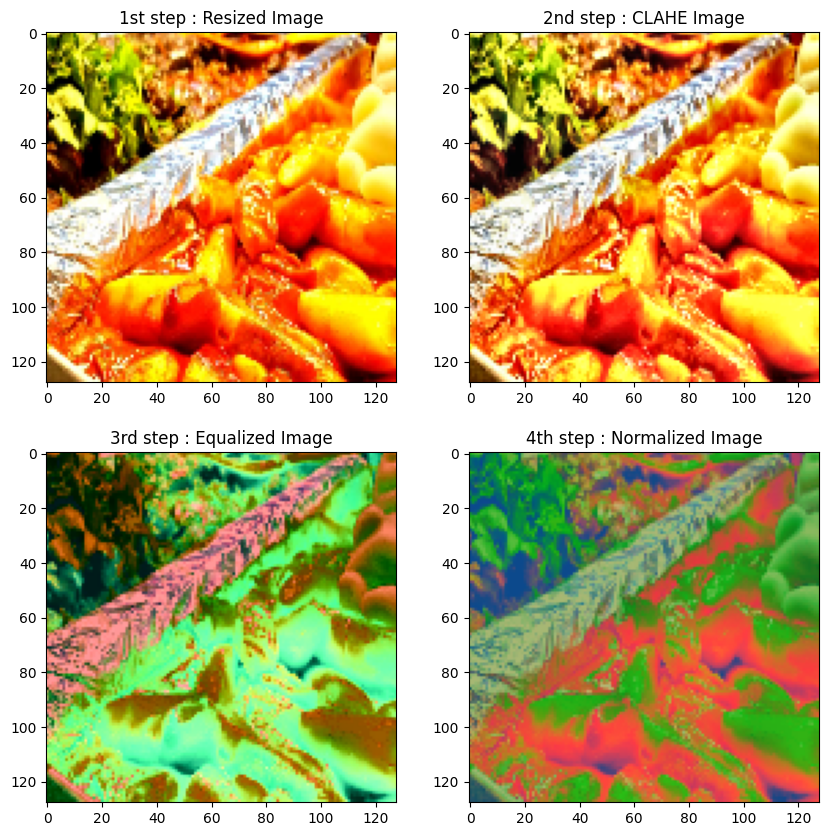

In [21]:
one_sample = random.choice(all_images)
img = plt.imread(one_sample)

plt.figure(figsize=(10,10))

resized_img = resize_image(img)
plt.subplot(2,2,1)
plt.title('1st step : Resized Image')
plt.imshow(resized_img)

img_yuv = cv2.cvtColor(resized_img, cv2.COLOR_BGR2YUV)
y, u, v = cv2.split(img_yuv)
clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8, 8))
y_clahe = clahe.apply(y)
cl_y_img  = cv2.merge([y_clahe, u, v])
clahe_img = cv2.cvtColor(cl_y_img, cv2.COLOR_YUV2BGR)
plt.subplot(2,2,2)
plt.title('2nd step : CLAHE Image')
plt.imshow(clahe_img)

img_cl_yuv = cv2.cvtColor(cl_y_img , cv2.COLOR_BGR2YUV)
y,u,v = cv2.split(img_cl_yuv)
equailized_y = he_img(y)
eq_y_img = cv2.merge([equailized_y, u, v])
eq_img= cv2.cvtColor(eq_y_img, cv2.COLOR_YUV2BGR)
plt.subplot(2,2,3)
plt.title('3rd step : Equalized Image')
plt.imshow(eq_img)

norm_image = normalize_img(eq_y_img)
a,b,c = norm_image.shape
plt.subplot(2,2,4)
plt.title('4th step : Normalized Image')
plt.imshow(norm_image)

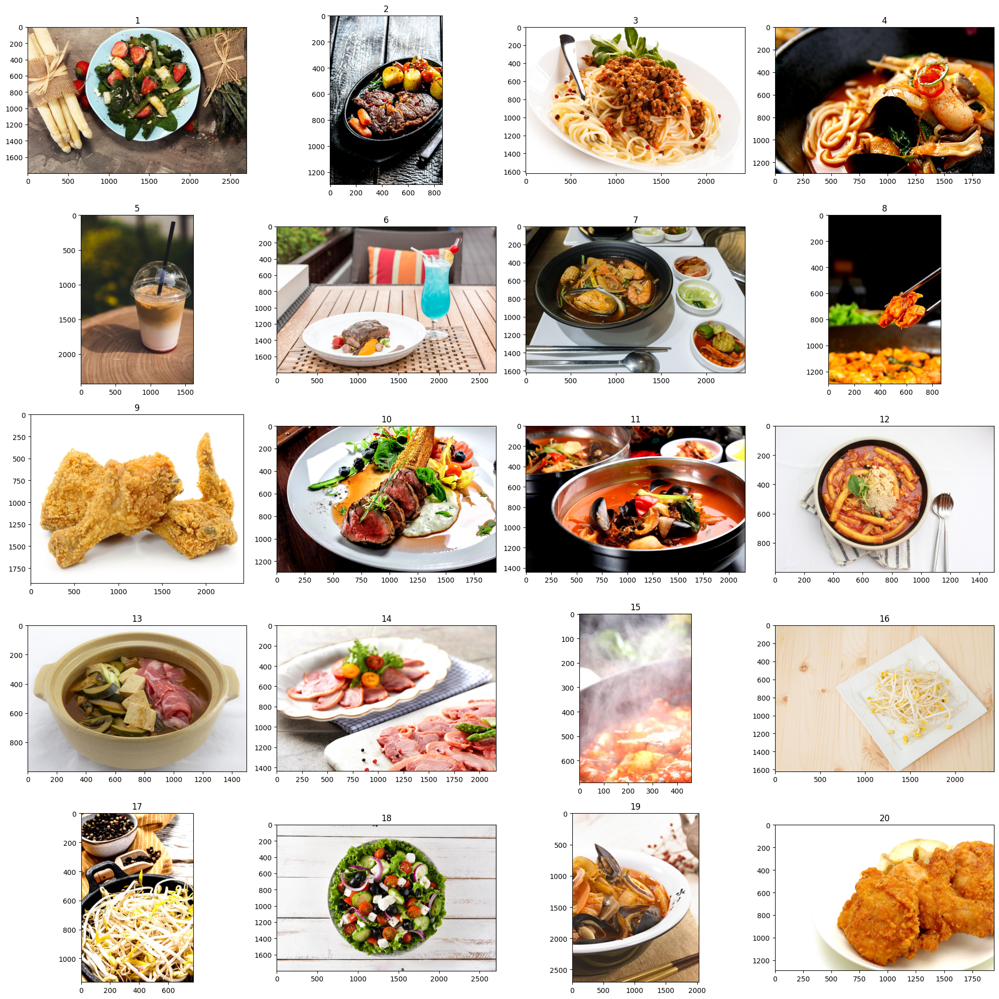

In [22]:
fig = plt.figure(1, figsize = (20,20))

sample_imgs = random.sample(all_images,20) 

for subplot, image_ in enumerate(sample_imgs): 
    imgs = plt.imread(image_ )
    a,b,c = imgs.shape
    fig = plt.subplot(5,4, subplot+1)
    fig.set_title(subplot+1)
    plt.imshow(imgs)
         
plt.tight_layout()

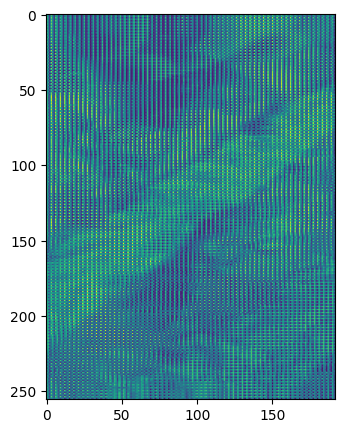

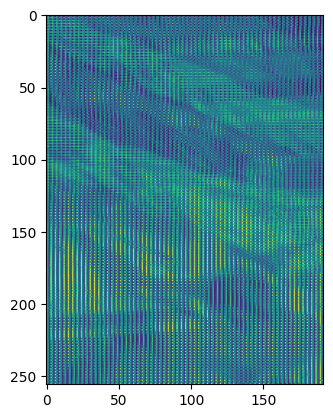

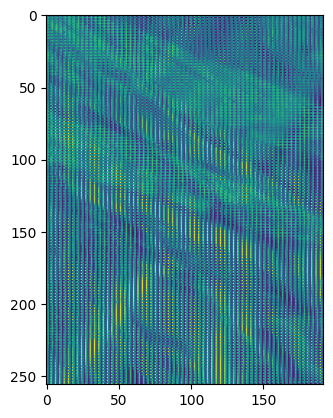

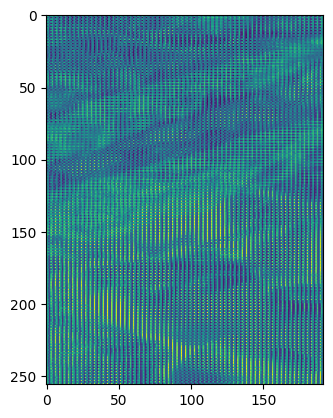

In [23]:
# Augmentation Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

img = image.img_to_array(norm_image)

datagen = ImageDataGenerator(
    rotation_range = 90,
    shear_range = 45,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

img = img.reshape((1, )+img.shape)
i = 0
fig = plt.figure(figsize=(5,5))
for batch in datagen.flow(img, batch_size=1):
    plt.imshow(batch[0].reshape(256, 192))
    plt.show()
    i += 1
    if i >=4:
        break

In [24]:
# 4 step Image PreProcessing
# precessed_images = []
# for i, file_name in enumerate(all_images):
#     img = plt.imread(file_name)
#     resized_img = resize_image(img)

#     img_yuv = cv2.cvtColor(resized_img, cv2.COLOR_BGR2YUV)
#     y, u, v = cv2.split(img_yuv)
#     clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8, 8))
#     y_clahe = clahe.apply(y)
#     cl_y_img  = cv2.merge([y_clahe, u, v])
#     img_cl_yuv = cv2.cvtColor(cl_y_img , cv2.COLOR_BGR2YUV)

#     y,u,v = cv2.split(img_cl_yuv)
#     equailized_y = he_img(y)
#     eq_y_img = cv2.merge([equailized_y, u, v])
#     eq_img= cv2.cvtColor(eq_y_img, cv2.COLOR_YUV2BGR)

#     image = normalize_img(eq_y_img)
#     a,b,c = image.shape

#     precessed_images.append(image)

# precessed_images

In [ ]:
train_datagen = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 90,
    zoom_range = 0.2,
    shear_range = 30,
    horizontal_flip = True,
    featurewise_center=True,
    validation_split=0.2

    )

train_generator = train_datagen.flow_from_directory(
    path,
    target_size=(256,256),
    class_mode='sparse',
    batch_size = 32,
    shuffle = False,
    subset = 'training'
    
    )  

validation_generator = train_datagen.flow_from_directory(
    path,
    target_size=(256,256),
    class_mode='sparse',
    batch_size = 32,
    shuffle = False,
    subset = 'validation'

)

print(train_generator.class_indices)

In [ ]:
from tensorflow.keras import models
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import InceptionV3,preprocess_input
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

IMAGE_SIZE = [256,256]

train_samples = 61600
validation_samples = 15386

inception = InceptionV3(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

for layer in inception.layers:
    layer.trainable = False

x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(256,activation='relu')(x)
x = Dropout(0.2)(x)

prediction = Dense(56, activation='softmax')(x)

model = Model(inputs=inception.input, outputs=prediction)

model.compile(
loss='sparse_categorical_crossentropy',
optimizer='adam',
metrics=['accuracy']
)  
checkpointer = ModelCheckpoint(filepath='inceptionV3.keras', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_inceptionV3.log')
history = model.fit(
    train_generator,
    batch_size=16,
    epochs=20,
    steps_per_epoch= train_samples//16,
    validation_data = validation_generator,
    validation_steps = validation_samples//16,
    verbose = 1,
    callbacks=[csv_logger, checkpointer]
    ) 

In [ ]:
model.save('Model_InceptionV3')

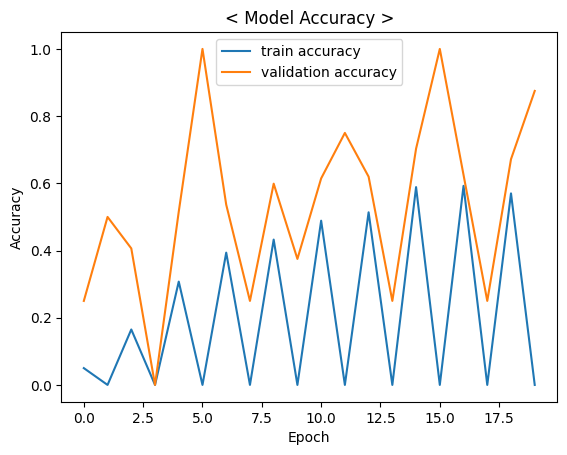

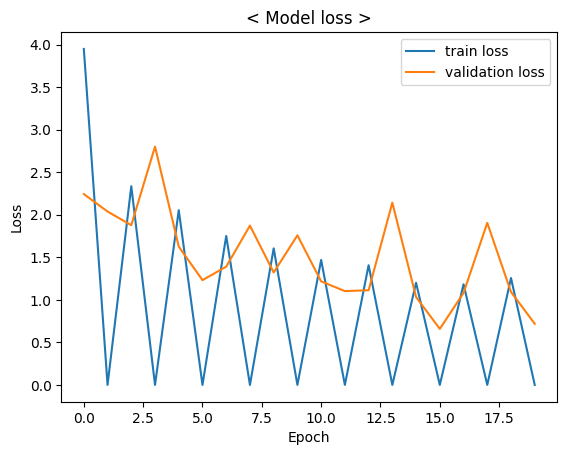

In [ ]:
def plot_accuracy(history):
    plt.plot(history.history['accuracy'], label='train accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.title('< Model Accuracy >')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_InceptionV3')
    plt.show()
    
def plot_loss(history):
    plt.plot(history.history['loss'], label="train loss")
    plt.plot(history.history['val_loss'], label="validation loss")
    plt.title('< Model loss >')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_InceptionV3')
    plt.show()

  
plot_accuracy(history)
plot_loss(history)

In [ ]:
from tensorflow.keras.optimizers import SGD

IMAGE_SIZE = [256,256]

train_samples = 61600
validation_samples = 15386

inception = InceptionV3(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

for layer in inception.layers[:-10]:
    layer.trainable = False

x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(256,activation='relu')(x)
x = Dropout(0.2)(x)

prediction = Dense(56, activation='softmax')(x)

model = Model(inputs=inception.input, outputs=prediction)
sgd = keras.optimizers.SGD(momentum=0.9, nesterov=True)

model.compile(
loss='sparse_categorical_crossentropy',
optimizer=sgd,
metrics=['accuracy']
)  
checkpointer = ModelCheckpoint(filepath='inceptionV3_sgd.keras', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_inceptionV3_sgd.log')
history_v3_sgd = model.fit(
    train_generator,
    batch_size=16,
    epochs=50,
    steps_per_epoch= train_samples//16,
    validation_data = validation_generator,
    validation_steps = validation_samples//16,
    verbose = 1,
    callbacks=[csv_logger, checkpointer]
    ) 

In [ ]:
model.save('Model_InceptionV3_sgd')

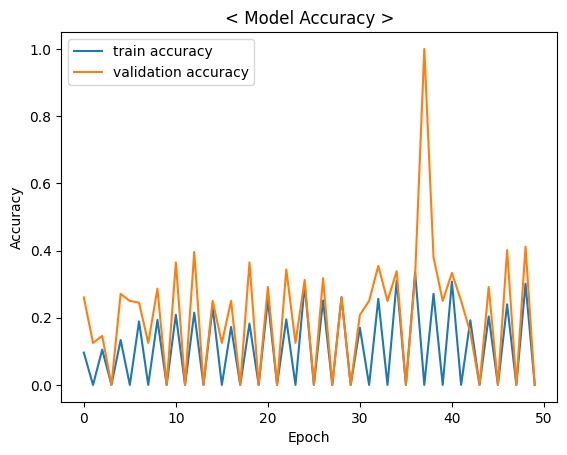

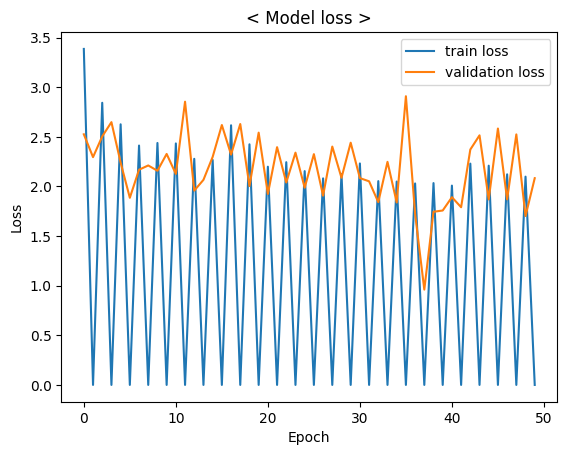

In [ ]:
plot_accuracy(history_v3_sgd)
plot_loss(history_v3_sgd)

In [ ]:
from tensorflow.keras.optimizers import SGD

IMAGE_SIZE = [256,256]

train_samples = 61600
validation_samples = 15386

inception = InceptionV3(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

for layer in inception.layers[:-10]:
    layer.trainable = False

x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(256,activation='relu')(x)
x = Dropout(0.2)(x)

prediction = Dense(56, activation='softmax')(x)

model = Model(inputs=inception.input, outputs=prediction)
sgd = keras.optimizers.SGD(momentum=0.9, nesterov=True)

model.compile(
loss='sparse_categorical_crossentropy',
optimizer=sgd,
metrics=['accuracy']
)  
checkpointer = ModelCheckpoint(filepath='inceptionV3_sgd.keras', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_inceptionV3_sgd.log')
history_v3_sgd = model.fit(
    train_generator,
    batch_size=16,
    epochs=20,
    steps_per_epoch= train_samples//16,
    validation_data = validation_generator,
    validation_steps = validation_samples//16,
    verbose = 1,
    callbacks=[csv_logger, checkpointer]
    ) 

In [ ]:
model.save('Model_InceptionV3_sgd.keras')

In [ ]:
plot_accuracy(history_v3_sgd)
plot_loss(history_v3_sgd)

In [ ]:
from keras.applications import DenseNet161

IMAGE_SIZE = [256,256]

train_samples = 61600
validation_samples = 15386

densenet = DenseNet161(
    include_top=False,
    weights="imagenet",
    input_shape=IMAGE_SIZE + [3]
)


for layer in densenet.layers:
    layer.trainable = False

x = densenet.output
x = GlobalAveragePooling2D()(x)
x = Dense(256,activation='relu')(x)
x = Dropout(0.2)(x)

prediction = Dense(56, activation='softmax')(x)

model = Model(inputs=densenet.input, outputs=prediction)
sgd = keras.optimizers.SGD(momentum=0.9, nesterov=True)

model.compile(
loss='sparse_categorical_crossentropy',
optimizer=sgd,
metrics=['accuracy']
)  
checkpointer = ModelCheckpoint(filepath='densenet_sgd.keras', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_densenet_sgd.log')
history_dense = model.fit(
    train_generator,
    batch_size=16,
    epochs=50,
    steps_per_epoch= train_samples//16,
    validation_data = validation_generator,
    validation_steps = validation_samples//16,
    verbose = 1,
    callbacks=[csv_logger, checkpointer]
    ) 

In [ ]:
model.save('Model_densenet_sgd.keras')

In [ ]:
plot_accuracy(history_dense)
plot_loss(history_dense)

In [ ]:
from keras.applications.resnet50 import ResNet50

resnet = ResNet50(include_top=False, weights="imagenet", input_shape=IMAGE_SIZE + [3])

for layer in resnet.layers:
    layer.trainable = False

x = resnet.output
x = GlobalAveragePooling2D()(x)
x = Dense(256,activation='relu')(x)
x = Dropout(0.2)(x)


prediction = Dense(56, activation='softmax')(x)

model = Model(inputs=resnet.input, outputs=prediction)
sgd = keras.optimizers.SGD(momentum=0.9, nesterov=True)

model.compile(
loss='sparse_categorical_crossentropy',
optimizer=sgd,
metrics=['accuracy']
)  
checkpointer = keras.callbacks.ModelCheckpoint(filepath='resnet_sgd.keras', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_resnet_sgd.log')
history_resnet = model.fit(
    train_generator,
    batch_size=16,
    epochs=50,
    steps_per_epoch= train_samples//16,
    validation_data = validation_generator,
    validation_steps = validation_samples//16,
    verbose = 1,
    callbacks=[csv_logger, checkpointer]
    ) 

In [ ]:
model.save('Model_resnet_sgd')

In [ ]:
plot_accuracy(history_resnet)
plot_loss(history_resnet)